# Sztuczne sieci neuronowe i głębokie uczenie - Sprawozdanie z laboratorium - Wojciech Kot

## Temat:

Konwolucyjne sieci neuronowe w zagadnieniu klasyfikacji obrazów I

### Cel ćwiczenia:

Stworzenie modelu klasyfikujacego gatunki kwiatów za pomocą technik transfer learning i fine tuning


### Wykorzystane narzędzia:

Colab, Python 3, Seaborn, Keras, Matplotlib, Numpy

### Zadanie 1 - trening z ustawieniami domyślnymi

Parametry: faza 1 - 5 epok; faza 2: 5 epok


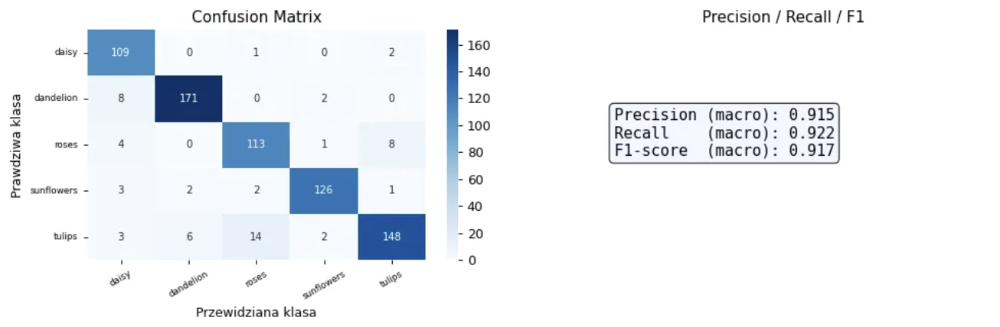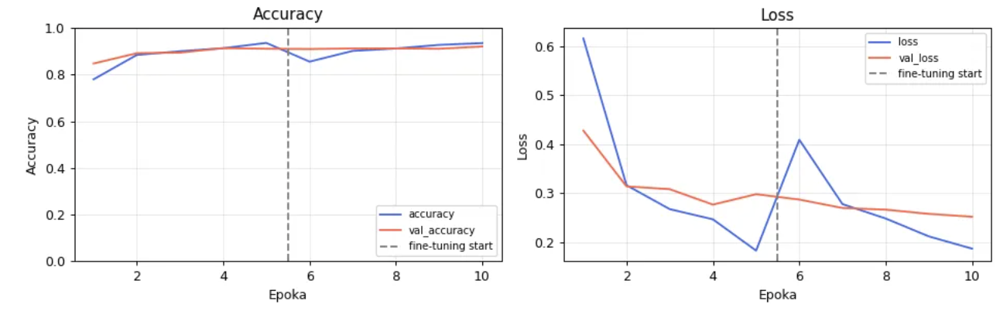

Zastosowanie transfer learning opartego na MobileNetV2 umożliwiło szybkie osiągnięcie wysokiej dokładności klasyfikacji (ponad 91%) już w pierwszych epokach mimo małej liczby próbek.

Kluczową rolę odegrał fine‑tuning: po odblokowaniu warstw bazowych po 5. epoce przeprowadzone dostrojenie pozwoliło precyzyjnie zaadaptować uniwersalne filtry do specyficznych cech botanicznych, co skutkowało dalszym zmniejszeniem błędu i ustabilizowaniem metryk Precision, Recall i F1 powyżej 0.91.

Brak przeuczenia potwierdzają: systematyczny spadek val_loss oraz zbieżność krzywych dokładności dla zbiorów treningowego i walidacyjnego, co wskazuje, że łączny czas treningu (5 epok z zamrożonymi wagami + 5 epok fine‑tuningu) był odpowiedni i model zachował zdolność generalizacji.

Chwilowy wzrost błędu zaobserwowany w 6. epoce wynika z „szoku optymalizatora” — nagłego odblokowania wag sieci bazowej i dostosowywania się optymalizatora (Adam) do nowych, uczonych parametrów.

### Zadanie 2 - Przeprowadzenie dwóch eksperymentów


- Eksperyment numer 1 - parametry: faza 1 - 3 epoki, faza 2 - 3 epoki

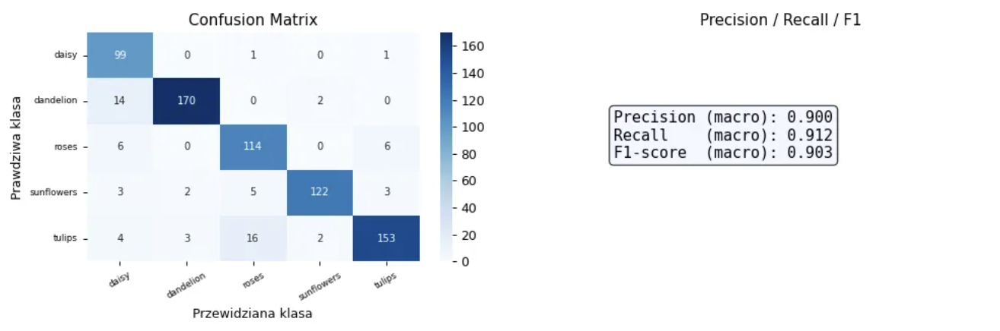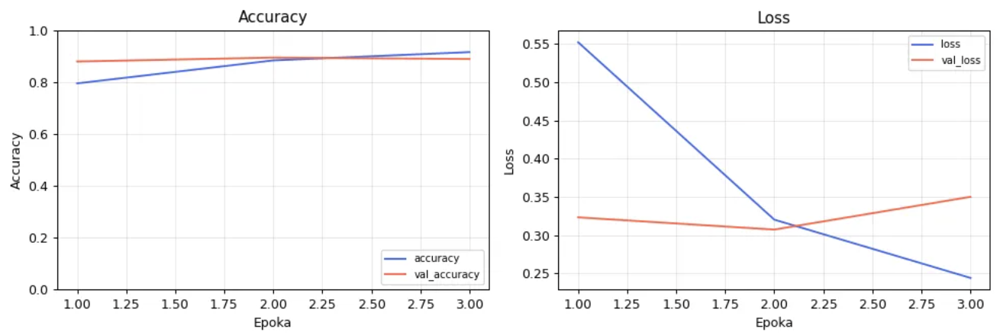

- Eksperyment numer 2 - parametry: faza 1 - 10 epoki, faza 2 - 10 epoki

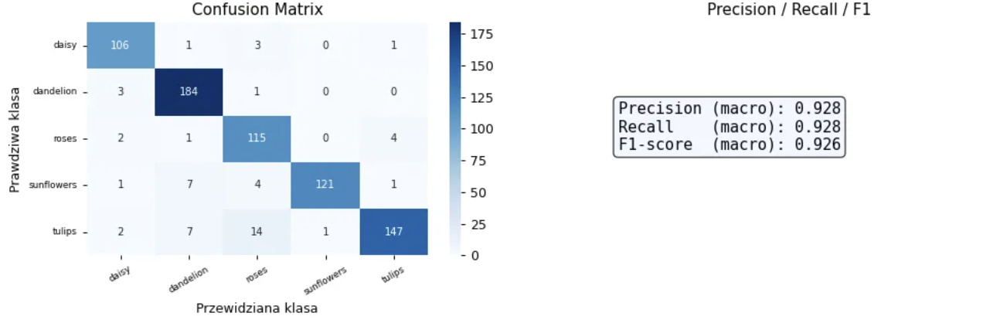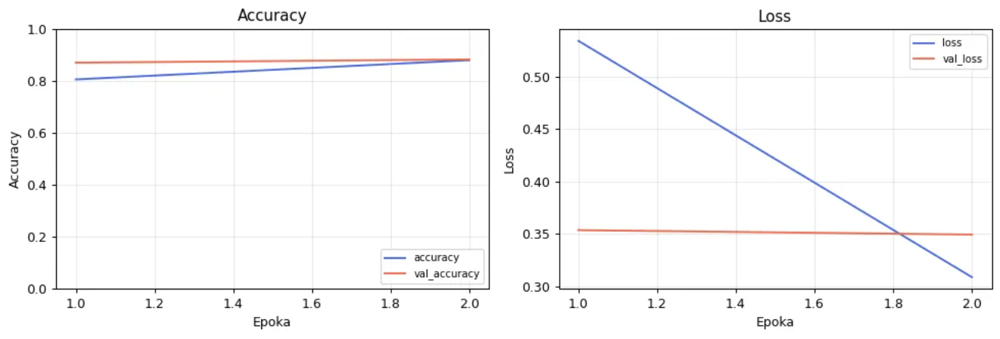

- Eksperyment 1; Precision: 0.9; Recall: 0.912; F1-score: 0.9
- Eksperyment 2; Precision: 0.93; Recal: 0.93; F1-score: 0.93

Model z eksperymentu 1 jest nieduczony i niestabliny. Model z eksperymentu 2 jest stabilny i posiada najlepszą precyzję.

Ustawienia 1 (faza 1: 3 epoki, faza 2: 3 epoki) dały najsłabsze wyniki spośród testowanych konfiguracji. Na wykresie val_loss (czerwona linia) po 2. epoce zaczyna gwałtownie rosnąć, podczas gdy błąd treningowy dalej spada — to sygnał przedwczesnego przerwania fine‑tuningu. Trzy epoki dostrajania okazały się niewystarczające do poprawnego zaadaptowania filtrów konwolucyjnych do specyfiki kwiatów, co przełożyło się na najniższe metryki (F1 = 0.903).

Ustawienia 2 (faza 1: 10 epok, faza 2: 10 epok) — łącznie 20 epok — przyniosły najlepsze rezultaty jakościowe (Precision = 0.928, Recall = 0.928, F1 = 0.926). Zarówno krzywe dokładności, jak i straty dla zbiorów treningowego i walidacyjnego poruszają się niemal równolegle i bardzo blisko siebie; val_loss stabilizuje się na niskim poziomie (~0.35) i nie wykazuje wzrostu charakterystycznego dla przeuczenia. Pomimo wydłużonego treningu model nie przeuczył się — dłuższy czas uczenia pozwolił optymalizatorowi lepiej dopasować filtry do specyficznych cech botanicznych, co przełożyło się na wysoką zdolność generalizacji.


### Zadanie 3

Najczęściej mylone klasy to tulipany i róże; pozostałe gatunki (np. stokrotki, słoneczniki) są rozpoznawane niemal bezbłędnie.

Główną przyczyną pomyłek jest duże podobieństwo wizualne — w fazie pąka oba gatunki mają zbliżony kształt i podobną paletę barw (czerwień, róż, żółć). W ujęciach z bliska sieć bazuje na gładkiej teksturze płatków i zielonym tle liści, które dla obu kwiatów są niemal identyczne; brak widocznych detali (kolców, charakterystycznej budowy łodygi) utrudnia wychwycenie subtelnych różnic, co prowadzi do błędnej klasyfikacji tulipanów jako róż.

###Zadanie 4

Klasyfikacja dla wybranych 10 kwiatów:

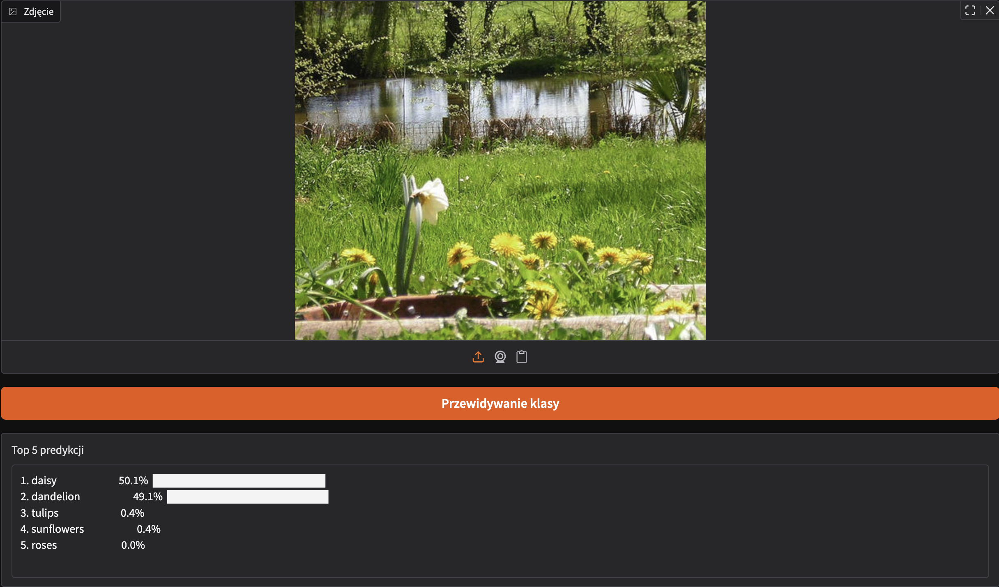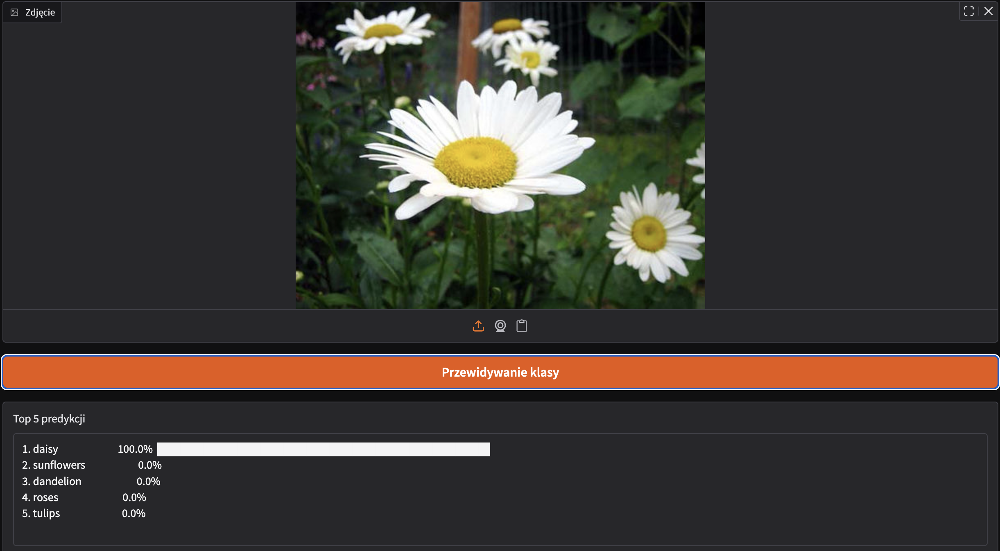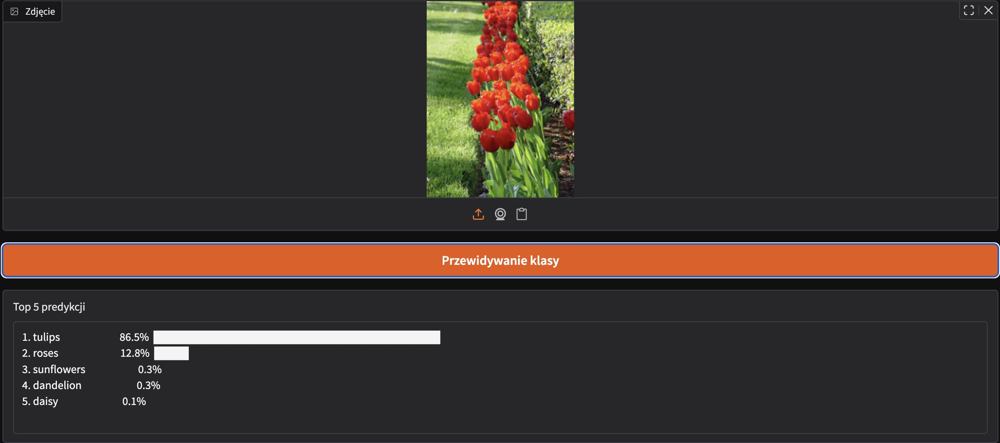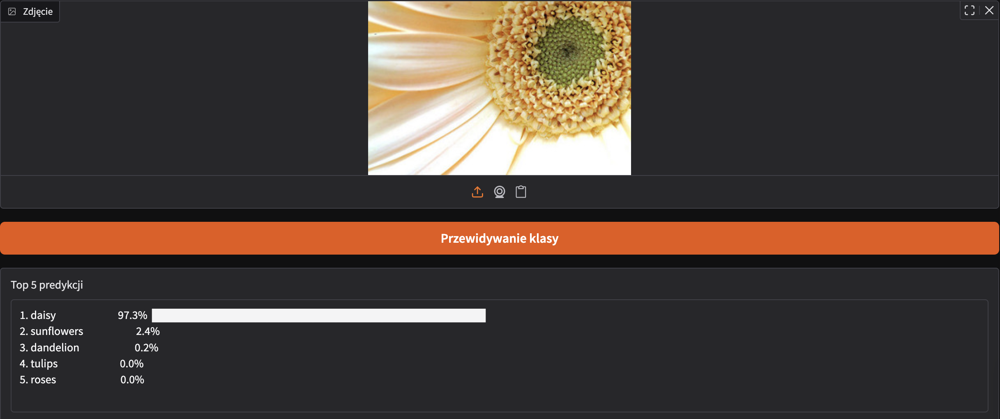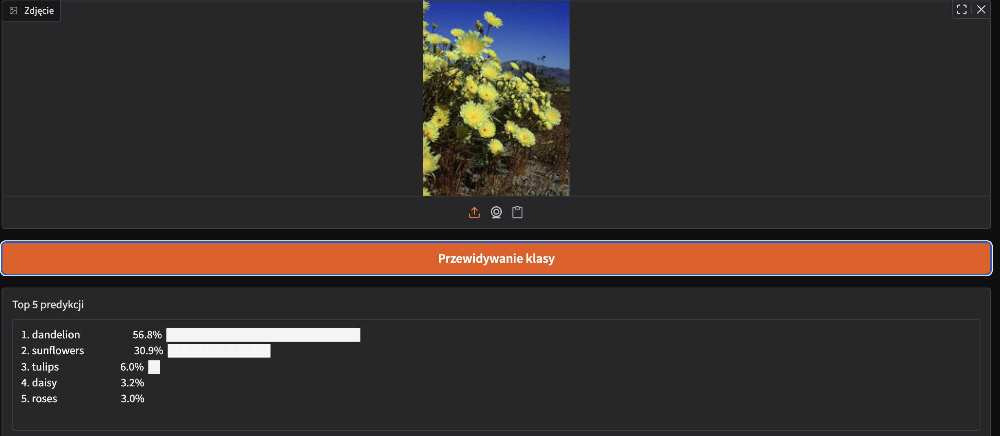

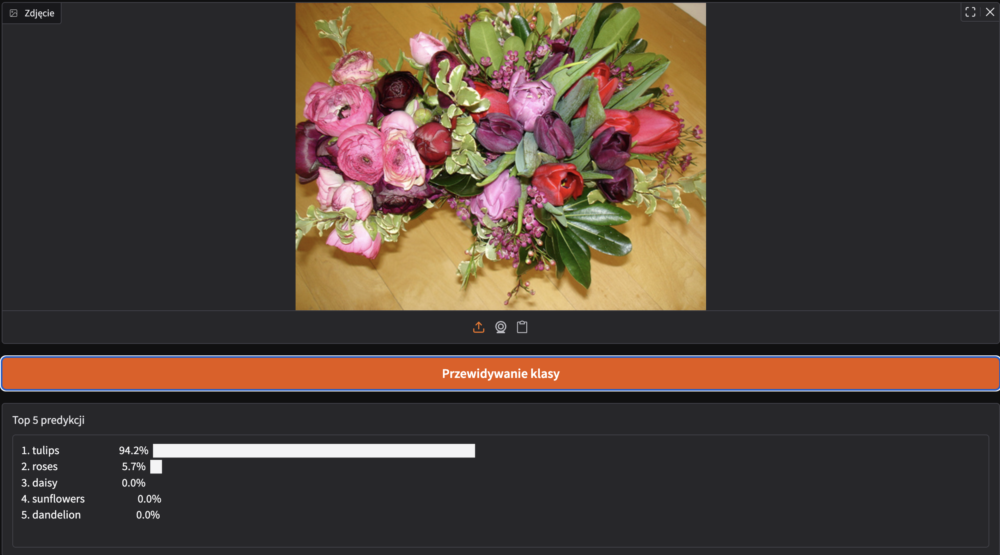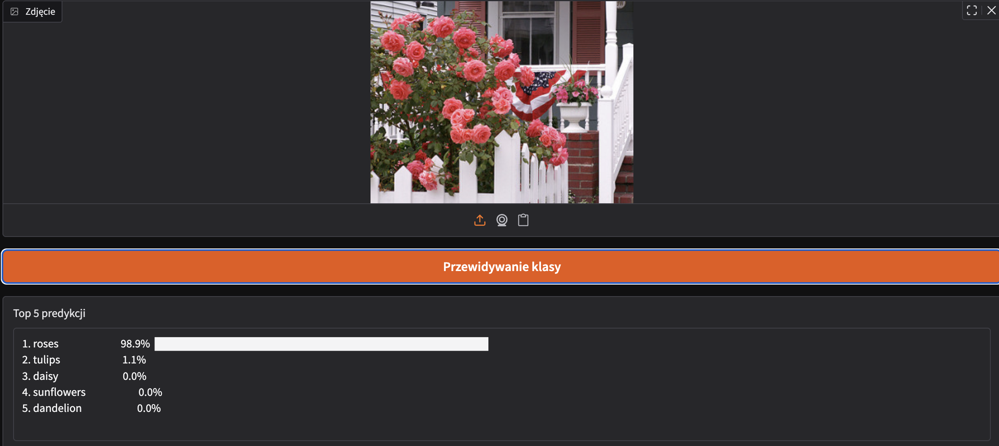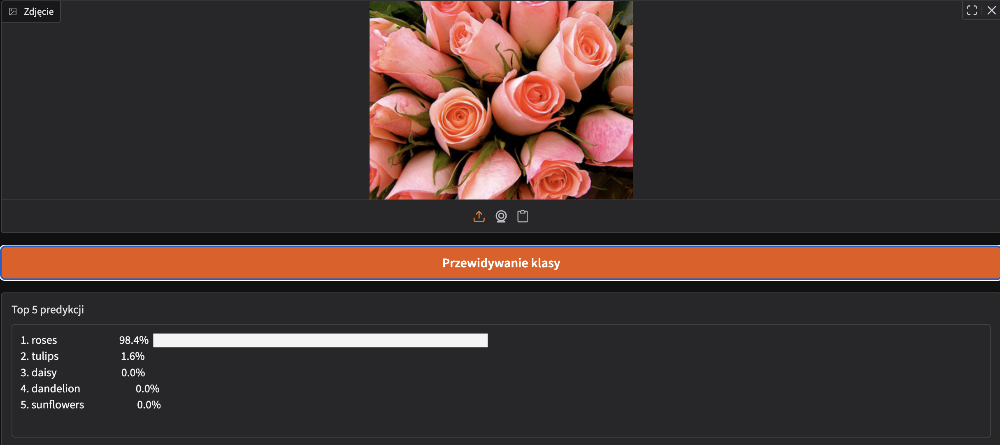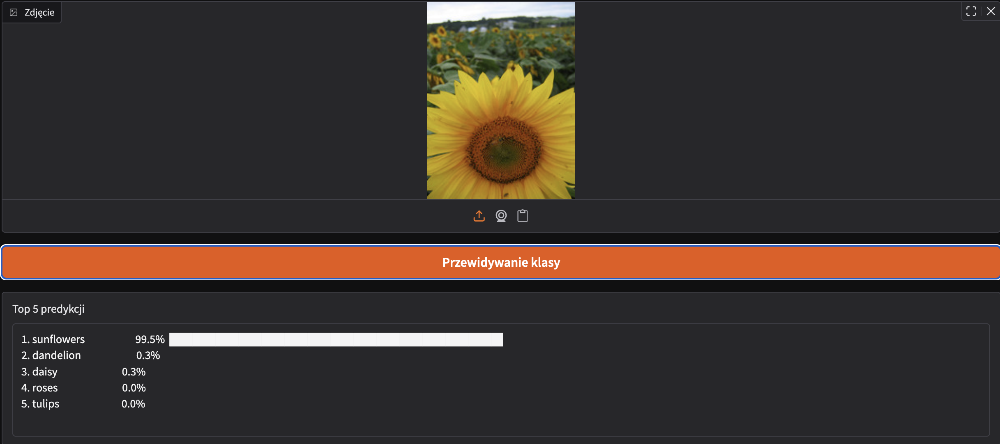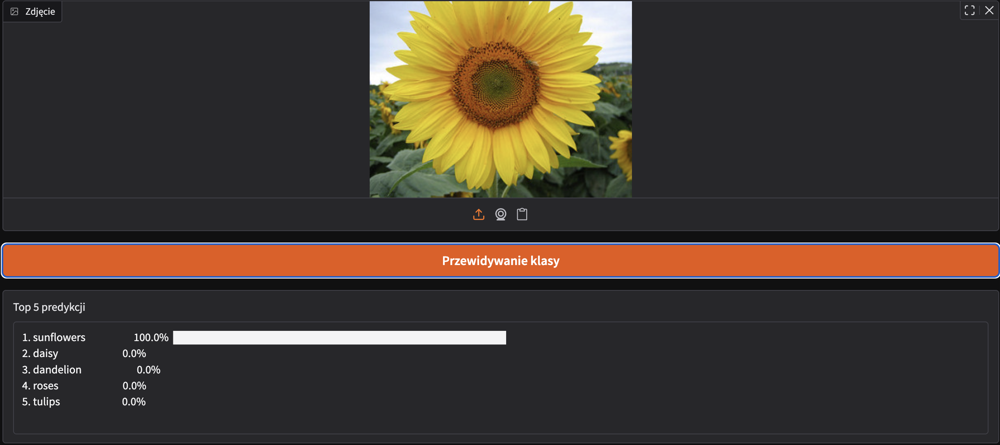

Zdjęcia z największą predykcją:

- Zdjęcie numer 2 - 100%
- Zdjęcie numer 10 - 100%
- Zdjęcie numer 9 - 99.5%
- Zdjęcie numer 7 - 98.9%
- Zdjęcie numer 8 - 98.4%

Obliczanie dokładności modelu:

$Accuracy = \frac{\text{Liczba zdjęć, które model odgadł POPRAWNIE}}{\text{Wszystkie zdjęcia, które wrzuciłaś (czyli 10)}} \times 100\%$

$Accuracy = \frac{\text{9}}{\text{10}} \times 100\%$ = 90%

Dokładność modelu wynosi dokładnie 90%.

### Zadanie 5

- Dlaczego zamrażamy bazę w fazie 1?

Zamrożenie wag sieci bazowej na początku procesu uczenia jest niezbędne ze względu na losową inicjalizację nowo dodanych warstw klasyfikatora wyjściowego. W początkowych krokach generują one bardzo duże błędy. Zamrożenie pozwala nowej głowicy klasyfikującej na bezpieczne douczenie się podstaw bez uszkadzania fundamentu modelu.

- Co daje fine-tuning w fazie 2?

Fine-tuning polega na odblokowaniu części warstw sieci bazowej i pozwoleniu na bardzo subtelną korektę ich wag przy użyciu minimalnego współczynnika uczenia. Proces ten umożliwia adaptację ogólnych filtrów konwolucyjnych (które wcześniej wykrywały po prostu krawędzie czy kolory) do specyficznych, unikalnych cech botanicznych obecnych w nowym zbiorze danych. W efekcie pozwala to modelowi na osiągnięcie pełnej zbieżności i znaczące podbicie ostatecznej dokładności (accuracy).

- Jaką przewagę ma MobileNetV2 wytrenowany na ImageNet nad siecią trenowaną od zera na tym datasecie?

Gotowy transfer wiedzy (Transfer Learning): Model pre-trenowany na ImageNet posiada już rozwiniętą zdolność ekstrakcji niskopoziomowych cech obrazu (linii, cieni, tekstur). Sieć trenowana od zera musi poświęcić pierwsze kilkadziesiąt epok na naukę tych absolutnych podstaw.

Redukcja ryzyka przeuczenia (Overfitting): Dostępny zbiór danych o kwiatach jest stosunkowo mały. Trening tak głębokiej architektury od zera na małej liczbie próbek niemal natychmiast doprowadziłby do sytuacji, w której sieć zapamiętałaby obrazy treningowe na pamięć, tracąc zdolność generalizacji.

Efektywność obliczeniowa: Dzięki wykorzystaniu gotowych wag, sieć osiąga docelową skuteczność na poziomie powyżej 90% w zaledwie kilkanaście epok (kilka minut pracy), podczas gdy trening from scratch wymagałby setek epok i potężnych zasobów sprzętowych, dając przy tym gorszy rezultat końcowy.

### Wnioski

Badanie potwierdziło, że Transfer Learning z użyciem MobileNetV2 pozwala szybko stworzyć efektywny klasyfikator obrazów (dokładność powyżej 91%) nawet przy małej ilości danych. Sukces zapewnił dwufazowy proces nauki: zamrożenie bazy w pierwszej fazie chroniło uniwersalne wagi, a fine-tuning w drugiej fazie dostosował filtry do unikalnych cech botanicznych kwiatów. Test na 10 nowych zdjęciach wykazał rzeczywistą dokładność 90%, co świadczy o dobrej zdolności modelu do generalizacji. Rzadkie błędy, np. mylenie mniszka ze stokrotką, są zgodne z macierzą pomyłek i wynikają z wizualnego podobieństwa tych gatunków w trudnych ujęciach.